# Machine Learning in a Nutshell
05.12.2019

**Chrismarie Enslin, Marco Kemmerling**   
**Cybernetics Lab IMA & IfU**

In [33]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Data Exploration

## Data Import

In [34]:
import pandas as pd
df_data = pd.read_csv('Gear_Shaft_Dataset.csv', delimiter=';', header=0)
df_data.head()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter,class
0,0.637494,0.310224,0.004732,3.493444,38.438535,42.662545,49.151251,1.244546,1.458960,0.100880,OK
1,0.652844,0.320212,0.004732,1.274442,39.551515,43.531334,49.179602,1.312920,1.522850,0.100293,OK
2,0.617482,0.288820,0.003994,1.729314,37.690105,43.455439,49.172410,1.199105,1.517454,0.102054,OK
3,0.595691,0.290698,0.005260,4.746772,38.070763,43.163878,49.167025,1.222921,1.495762,0.100000,OK
4,0.603474,0.309191,0.003827,1.961616,38.626447,42.834841,49.169505,1.257468,1.470745,0.101174,OK


In [35]:
df_data.describe()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter
count,9989.000000,9991.000000,9990.000000,9976.000000,9988.000000,9987.000000,9988.000000,9987.000000,9987.000000,9991.000000
mean,0.620283,0.317660,0.518787,2.992198,31.668279,43.587005,49.155461,0.830850,1.526328,0.425099
std,0.052734,0.039477,0.284308,1.146554,4.073884,2.171858,0.181184,0.248838,0.160293,0.225916
min,0.438529,0.200000,0.000000,1.000000,20.000000,37.907771,34.154053,0.100000,1.108587,0.100000
25%,0.586970,0.294798,0.316480,2.008489,28.683045,42.067167,49.143034,0.648005,1.414750,0.209888
50%,0.622533,0.310770,0.495771,2.970487,31.775417,43.504936,49.161670,0.836492,1.520169,0.527054
75%,0.648649,0.339918,0.722019,3.979186,34.954364,45.221185,49.174364,1.031588,1.646402,0.628140
max,0.800000,0.443355,1.000000,5.000000,41.874653,50.000000,50.000000,1.463049,1.997237,1.184624


# Data preprocessing


## Encoding

In [36]:
df_data_enc = df_data.copy()
df_data_enc['class'] = df_data_enc['class'].map({'OK':True, 'Failure':False})
df_data_enc['class'].head()

0    True
1    True
2    True
3    True
4    True
Name: class, dtype: bool

## Handling NAs

In [37]:
print('Df size with NaNs: {}'.format(df_data_enc.shape))
df_data_enc = df_data_enc.dropna()
print('Df size without NaNs: {}'.format(df_data_enc.shape))

Df size with NaNs: (10000, 11)
Df size without NaNs: (9876, 11)


# Creating and Validating Prediction Model
In the following we are going to train a simple decision tree model.

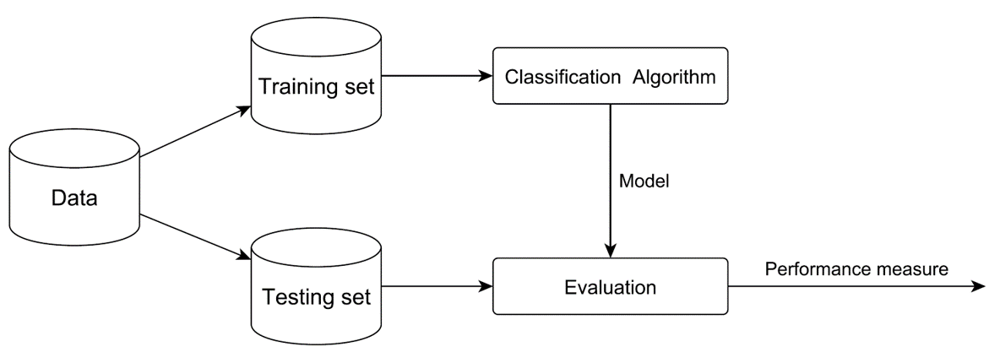


## Train and Visualise a Decision Tree Classification Model 

First, we will split our data into a feature matrix, which serves as input to our model and a target vector, which contains the values our model is supposed to predict. 

In [38]:
# X will be our feature matrix
X = df_data_enc.iloc[:, :-1] # here we select everything but the last column from the data

# y will be our target variable 
y = df_data_enc.iloc[:, -1] # here we select only the last column from our data

print(f"shape of dataset: {df_data_enc.shape}, shape of feature matrix: {X.shape}")

shape of dataset: (9876, 11), shape of feature matrix: (9876, 10)


We want to train our model on a certain subset of the data and evaluate it on a different subset of the data (the two subsets should be disjoint). 

**Your turn:** split *X* into *X_train* and *X_test*, split *y* into *y_train* and *y_test*. Hint: the following function from scikit-learn might come in handy: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [39]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.9, random_state=100)

Finally it is time to define and train our model

In [40]:
# In this case we will use the DecisionTreeClassifier as a model
from sklearn.tree import DecisionTreeClassifier 
DecisionTree = DecisionTreeClassifier(criterion = 'entropy',
                                      random_state = 42,
                                      max_depth = 3,
                                      min_samples_leaf = 100)



**Your turn:** Train our DecisionTree using the fit(...) method

In [41]:
DecisionTree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

Of course, now we want to see how the resulting decision tree looks like. In the following we define a method which creates a visualization from a trained decision tree model

In [42]:
from graphviz import Source
from sklearn import tree
from IPython.display import SVG

def display_tree(model, feature_names, class_names):     
    graph = Source(tree.export_graphviz(DecisionTree,
                                        out_file = None,
                                        feature_names = feature_names,
                                        class_names = class_names,
                                        filled = True))

    display(SVG(graph.pipe(format='svg')))

This method can now be executed for any given trained decision tree model:

In [43]:
feature_names = X.columns.values 
class_names = ['OK', 'Failure']

display_tree(DecisionTree, feature_names, class_names)

ExecutableNotFound: failed to execute ['dot', '-Tsvg'], make sure the Graphviz executables are on your systems' PATH

**Your turn:** At this point you can experiment with the *max_depth* and *min_samples_leaf* parameters of the decision tree model to see how the resulting tree changes. What is a good value to choose? Which values do not make sense?

## Model validation

We need to make sure that the model we trained performs well on data is has not seen yet, i.e. the test set. 

**Your turn:** Use the predict method of the decision tree model on the X_test matrix to produce a vector of predictions called y_pred

In [44]:
y_pred = DecisionTree.predict(X_test)

Using these predicted values and the actual values in the test set, we can compute the accuracy of the model on the test set

In [45]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print(f"accuracy on the test set: {accuracy}")

accuracy on the test set: 0.8479019012262347


But the accuracy metric can be misleading and does not paint a good picture of how the model behaves in different situation. 

**Your turn:** Use the confusion_matrix metric to gain more insights into the models performance

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix

In [46]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
print(cm)

[[3969  502]
 [ 850 3568]]


The confusion matrix returned by the scikit-learn method is just a bare array of values. To get an easier to interpret visualization, you can feed it into the method provided below

In [47]:
import plotly.figure_factory as ff

def show_confusion_matrix(confusion_matrix): 
    (tp, fn), (fp, tn) = confusion_matrix
    precision = np.round(tp / (tp + fp), decimals=3) * 100
    recall = np.round(tp / (tp + fn), decimals=4) * 100
    acc = np.round((tp + tn) / (tp + fn + fp + tn), decimals=4) * 100

    table_data = [[" ", "<b>Predicted class: OK</b>", "<b>Predicted class: Failure</b>"," "],
                  ["<b>Actual class: OK</b>", tp, cm[0, 1],f"<b>Recall =\n{str(recall)}%</b>"], 
                  ["<b>Actual class: Failure</b>", cm[1, 0], cm[1, 1], " "],
                  [" ", f"<b>Precision =\n{str(precision)}%</b>", " ", f"<b>Accuracy = \n{str(acc)}%</b>"
                  ]]

    table = ff.create_table(table_data, height_constant=60)
    py.offline.iplot(table)

**Your turn:** Feed the confusion matrix you created in the method defined above 

In [48]:
show_confusion_matrix(cm)

**Your turn:** Try a model other than a decision tree! 

Models you might want to try: 
- https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier
- https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression
- https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB

In [49]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm)

In [50]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm)

In [51]:
from sklearn.decomposition import PCA

from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
pca = PCA(n_components=7)
X_train_ = pca.fit_transform(X_train)
X_test_ = pca.transform(X_test)
gnb.fit(X_train_, y_train)
y_pred = gnb.predict(X_test_)
cm = confusion_matrix(y_test, y_pred)
show_confusion_matrix(cm)